In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
from my_class import WhaleOptimization

In [2]:
def himmelblau(X):
    """ Function for evaluating the Himmelblau function.
    
    Parameters:
    -----------
        x: np.ndarray or list
    
    Returns:
    --------
        result: float

     """
    result = np.power((np.power(X[0],2)+X[1]-11),2)+np.power((X[0]+np.power(X[1],2)-7),2)
    return result


In [15]:
## Parameters for simulation 
f = himmelblau

Nr_whales  = 50
Nr_iterations = 30

x_lower, x_upper = -6, 6
y_lower, y_upper = -6, 6

dimensions_bounds = np.array([[x_lower, x_upper],[y_lower, y_upper]])

a = 2
b = 0.5

In [16]:
my_sim = WhaleOptimization(f,Nr_whales,dimensions_bounds,a,b,Nr_iterations,True)
my_sim.simulate()
solution = my_sim.best_position

----------Performing whale optimization----------


100%|██████████| 60/60 [00:00<00:00, 382.99it/s]


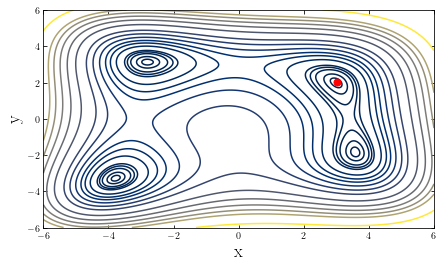

In [17]:
## Defining plot ##
fig, ax = plt.subplots(1,1,figsize = (7,4))

plt.rc('text', usetex=True)
plt.rc("font", family=["Helvetica", "Arial"])
plt.rc("xtick", top=True, direction="in")
plt.rc("ytick", right=True, direction="in")

xlims = [dimensions_bounds[0][0],dimensions_bounds[0][1]]
ylims = [dimensions_bounds[1][0],dimensions_bounds[1][1]]
ax.set_xlim(xlims[0],xlims[1]), ax.set_ylim(ylims[0],ylims[1])
ax.set_xlabel("x",size=18), ax.set_ylabel("y",size=18)

## Determining levels in function: i.e. Z = 0, 1, 4, 10.... ##
levels = [0,1,4,10,15,20,40,60,80,110,150,200,300,400,500,600,700,1000]

## Setting values for  contourplot ##
xlist = np.linspace(xlims[0],xlims[1],1000)
ylist = np.linspace(ylims[0],ylims[1],1000)
X, Y  = np.meshgrid(xlist,ylist)
Z = f([X,Y])

## Plotting ##
contour_plot = ax.contour(X,Y,Z, levels, antialiased=True,cmap = 'cividis')
ax.plot(solution[0],solution[1],'ro',ms = 7)
plt.show()

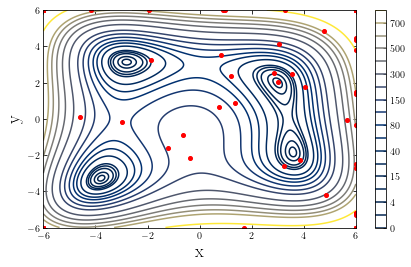

In [18]:

fig, ax = plt.subplots(1,1,figsize = (7,4))

ax.set_xlabel("x",size=18), ax.set_ylabel("y",size=18)


contour_plot = ax.contour(X,Y,Z, levels, antialiased=True, cmap = 'cividis')
fig.colorbar(contour_plot)

food_sources, = ax.plot([],[],'o',   color='r',ms = 4)

def update(i):
    food_sources.set_data(my_sim.position_history[i][:,0],my_sim.position_history[i][:,1])
 
    return food_sources,

ax.set_xlim(xlims[0],xlims[1])
ax.set_ylim(ylims[0],ylims[1])


anim = animation.FuncAnimation(fig,
                               update,
                               frames       = len(my_sim.position_history),
                               interval     = 500,
                               blit         = True,
                               repeat_delay = 0)

# Set up formatting for the movie files

## uncomment below to save mp4 ##
#writervideo = animation.FFMpegWriter(fps=5)
#anim.save("ArtificalBeeColony.mp4", dpi=450, writer=writervideo)   
anim